In [68]:
import pandas as pd 
import matplotlib.pyplot as plt

In [101]:
FILE = '../datasets/ESS/ess_9.csv'

In [102]:
pvq = pd.read_csv(FILE)

In [103]:
length = len(pvq)
shape = pvq.shape

print(f"Length: {length} \nShape: {shape}")

Length: 46276 
Shape: (46276, 35)


In [104]:
pd.set_option('display.max_columns', None)

pvq.head()

,cntry,cname,cedition,cproddat,cseqno,name,essround,edition,idno,dweight,pspwght,pweight,anweight,lrscale,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun
0,AT,ESS1-9e01,1.0,10.12.2020,10724,ESS9e03,9,3.0,27,0.581174,0.218111,0.302091,0.065890,9,2.0,2.0,2.0,2.0,2.0,2.0,2.0,3.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,3.0
1,AT,ESS1-9e01,1.0,10.12.2020,10725,ESS9e03,9,3.0,137,1.062772,0.413473,0.302091,0.124907,5,3.0,4.0,3.0,3.0,2.0,4.0,4.0,3.0,4.0,3.0,3.0,3.0,4.0,3.0,5.0,2.0,3.0,2.0,3.0,3.0,3.0
2,AT,ESS1-9e01,1.0,10.12.2020,10726,ESS9e03,9,3.0,194,1.376509,2.270293,0.302091,0.685836,5,3.0,5.0,3.0,3.0,4.0,4.0,3.0,3.0,3.0,4.0,2.0,2.0,3.0,2.0,3.0,2.0,3.0,3.0,3.0,3.0,3.0
3,AT,ESS1-9e01,1.0,10.12.2020,10727,ESS9e03,9,3.0,208,0.993399,0.386483,0.302091,0.116753,88,2.0,5.0,1.0,1.0,1.0,3.0,2.0,1.0,2.0,3.0,1.0,1.0,1.0,1.0,6.0,1.0,1.0,1.0,1.0,2.0,3.0
4,AT,ESS1-9e01,1.0,10.12.2020,10728,ESS9e03,9,3.0,220,0.377353,1.032102,0.302091,0.311789,5,2.0,6.0,1.0,4.0,2.0,4.0,2.0,3.0,3.0,2.0,2.0,2.0,6.0,2.0,6.0,1.0,3.0,2.0,1.0,1.0,3.0


In [105]:
pvq_imp_columns = pvq.copy()

Following...
- [x] remove data on religiousness attribute (i.e. rlgdgr)& other random columns
- [x] create a "mapping" list (of questions to values) from which the average will be derived. To identify mapping look at [the relevant paper](https://www.europeansocialsurvey.org/docs/methodology/core_ess_questionnaire/ESS_core_questionnaire_human_values.pdf) on page 284
- [x] plot a distribution of the political-preference attribute (lrscale) to identify any biases in the data (or just skewed data)
- [x] return whatever yields higher accuracy and lower error

### Removing irrelevant columns & false responses or Selecting important columns

In [106]:
#Removing 
#pvq_imp_columns.drop(['ess8_id', 'cntry', 'ess8_reg','nuts1', 'nuts2','nuts3', 'rlgdgr','Unnamed: 29'], inplace=True, axis=1)

#Selecting
pvq_imp_columns = pvq_imp_columns[["lrscale","ipcrtiv","imprich","ipeqopt","ipshabt","impsafe","impdiff","ipfrule","ipudrst","ipmodst","ipgdtim","impfree","iphlppl","ipsuces","ipstrgv","ipadvnt","ipbhprp","iprspot","iplylfr","impenv","imptrad","impfun"]]

In [107]:
pvq_imp_columns.shape

(46276, 22)

In [108]:
pvq_imp_columns

,lrscale,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun
0,9,2.0,2.0,2.0,2.0,2.0,2.0,2.0,3.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,3.0
1,5,3.0,4.0,3.0,3.0,2.0,4.0,4.0,3.0,4.0,3.0,3.0,3.0,4.0,3.0,5.0,2.0,3.0,2.0,3.0,3.0,3.0
2,5,3.0,5.0,3.0,3.0,4.0,4.0,3.0,3.0,3.0,4.0,2.0,2.0,3.0,2.0,3.0,2.0,3.0,3.0,3.0,3.0,3.0
3,88,2.0,5.0,1.0,1.0,1.0,3.0,2.0,1.0,2.0,3.0,1.0,1.0,1.0,1.0,6.0,1.0,1.0,1.0,1.0,2.0,3.0
4,5,2.0,6.0,1.0,4.0,2.0,4.0,2.0,3.0,3.0,2.0,2.0,2.0,6.0,2.0,6.0,1.0,3.0,2.0,1.0,1.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46271,10,2.0,2.0,2.0,2.0,2.0,3.0,3.0,2.0,5.0,4.0,3.0,3.0,3.0,3.0,4.0,3.0,3.0,3.0,3.0,3.0,3.0
46272,9,3.0,3.0,3.0,2.0,1.0,3.0,3.0,3.0,4.0,3.0,3.0,3.0,3.0,3.0,2.0,3.0,3.0,1.0,3.0,3.0,3.0
46273,5,2.0,4.0,3.0,3.0,2.0,2.0,3.0,2.0,2.0,5.0,2.0,4.0,3.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0
46274,3,4.0,4.0,2.0,5.0,1.0,4.0,3.0,3.0,2.0,4.0,2.0,3.0,5.0,2.0,5.0,2.0,5.0,1.0,1.0,1.0,2.0


Counting the false responses for each of the relevant columns

In [109]:
for column in pvq_imp_columns:
    if column == "lrscale":
        pvq_over_10 = pvq.loc[pvq[column] > 10]
        print(f"{column}: {pvq_over_10.shape}")
    else:
        pvq_over_6 = pvq.loc[pvq[column] > 6]
        print(f"{column}: {pvq_over_6.shape}")

lrscale: (6050, 35)
ipcrtiv: (1067, 35)
imprich: (888, 35)
ipeqopt: (1005, 35)
ipshabt: (976, 35)
impsafe: (815, 35)
impdiff: (957, 35)
ipfrule: (1245, 35)
ipudrst: (1065, 35)
ipmodst: (936, 35)
ipgdtim: (917, 35)
impfree: (909, 35)
iphlppl: (886, 35)
ipsuces: (1067, 35)
ipstrgv: (1241, 35)
ipadvnt: (966, 35)
ipbhprp: (1030, 35)
iprspot: (1152, 35)
iplylfr: (837, 35)
impenv: (835, 35)
imptrad: (837, 35)
impfun: (934, 35)


In [110]:
lrscale = pvq_imp_columns["lrscale"]
lrscale_cleaned = lrscale.copy()

In [111]:
lrscale_cleaned = lrscale_cleaned.to_frame(name="lrscale")

lrscale_cleaned = lrscale_cleaned[lrscale_cleaned.lrscale <= 10]

In [112]:
lrscale_cleaned.shape

(40226, 1)

## Distribution of lrscale

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7ff88e73dc10>]],
      dtype=object)

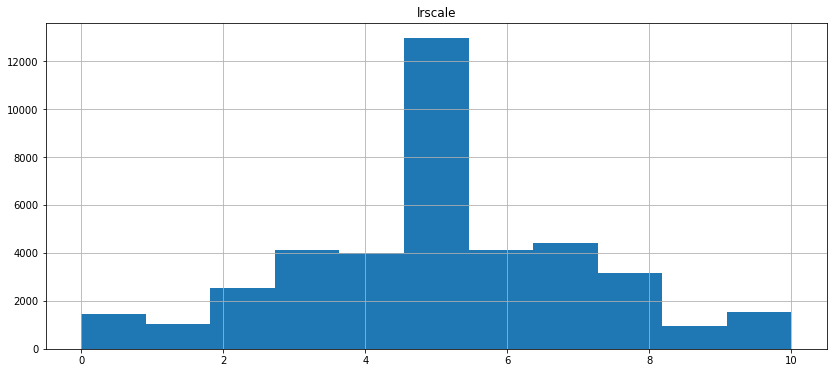

In [113]:
# ax = sns.distplot(lrscale_cleaned)
# plt.show()
lrscale_cleaned.hist(bins=11, figsize=[14,6])

## Cleaning the data

removing all invalid rows (i.e. with lrscale values over 10 and the rest over 6)

In [114]:
pvq_cleaned = pvq_imp_columns.copy()

indexNums = pvq_cleaned[(pvq_cleaned['lrscale'] > 10) | (pvq_cleaned['ipeqopt'] > 6) | (pvq_cleaned['ipudrst'] > 6) 
                        | (pvq_cleaned['impenv'] > 6) | (pvq_cleaned['ipshabt'] > 6) | (pvq_cleaned['ipsuces'] > 6)
                        | (pvq_cleaned['iphlppl'] > 6)| (pvq_cleaned['iplylfr'] > 6) | (pvq_cleaned['ipcrtiv'] > 6)
                        | (pvq_cleaned['impfree'] > 6) | (pvq_cleaned['impdiff'] > 6) | (pvq_cleaned['ipadvnt'] > 6)
                        | (pvq_cleaned['ipgdtim'] > 6) | (pvq_cleaned['impfun'] > 6) |(pvq_cleaned['imprich'] > 6)
                        | (pvq_cleaned['iprspot'] > 6) | (pvq_cleaned['impsafe'] > 6) | (pvq_cleaned['ipstrgv'] > 6) 
                        | (pvq_cleaned['ipfrule'] > 6) | (pvq_cleaned['ipbhprp'] > 6) | (pvq_cleaned['ipmodst'] > 6)
                        | (pvq_cleaned['imptrad'] > 6)].index


pvq_cleaned.drop(indexNums, inplace=True, axis=0)
# pvq_cleaned.shape


## Mapping (questions to values)

Approach: Create a human value dictionary: For each value, create a list of questions (strings) corresponding to that value

In [115]:
values = {'universalism':[],'achievement':[],'benevolence':[],'self_direction':[],'stimulation':[],'hedonism':[],'power':[],
         'security':[], 'conformity':[], 'tradition':[]}

universalism = ['ipeqopt','ipudrst','impenv']
# values.append(universalism)
values["universalism"] = universalism

achievement = ['ipshabt','ipsuces']
# values.append(achievement)
values["achievement"] = achievement

benevolence = ['iphlppl', 'iplylfr']
# values.append(benevolence)
values["benevolence"] = benevolence

self_direction = ['ipcrtiv', 'impfree']
# values.append(self_direction)
values['self_direction'] = self_direction

stimulation = ['impdiff', 'ipadvnt']
# values.append(stimulation)
values['stimulation'] = stimulation

hedonism = ['ipgdtim', 'impfun']
# values.append(hedonism)
values['hedonism'] = hedonism

power = ['imprich', 'iprspot']
# values.append(power)
values['power'] = power

security = ['impsafe', 'ipstrgv']
# values.append(security)
values['security'] = security

conformity = ['ipfrule', 'ipbhprp']
# values.append(conformity)
values['conformity'] = conformity

tradition = ['ipmodst','imptrad']
# values.append(tradition)
values['tradition'] = tradition


In [116]:
pvq_cleaned.to_csv(r'ess_9_cleaned.csv', index= False)

## Reversing Likert Scale

In [117]:
pvq_reversed = pvq_cleaned.copy()
pvq_cleaned.head(20)

,lrscale,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun
0,9,2.0,2.0,2.0,2.0,2.0,2.0,2.0,3.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,3.0
1,5,3.0,4.0,3.0,3.0,2.0,4.0,4.0,3.0,4.0,3.0,3.0,3.0,4.0,3.0,5.0,2.0,3.0,2.0,3.0,3.0,3.0
2,5,3.0,5.0,3.0,3.0,4.0,4.0,3.0,3.0,3.0,4.0,2.0,2.0,3.0,2.0,3.0,2.0,3.0,3.0,3.0,3.0,3.0
4,5,2.0,6.0,1.0,4.0,2.0,4.0,2.0,3.0,3.0,2.0,2.0,2.0,6.0,2.0,6.0,1.0,3.0,2.0,1.0,1.0,3.0
5,3,4.0,6.0,1.0,2.0,2.0,3.0,4.0,1.0,1.0,1.0,1.0,1.0,3.0,2.0,3.0,1.0,2.0,1.0,1.0,1.0,1.0
6,3,2.0,3.0,2.0,2.0,3.0,2.0,3.0,3.0,4.0,2.0,2.0,3.0,3.0,2.0,2.0,3.0,3.0,3.0,3.0,3.0,2.0
7,7,3.0,4.0,4.0,4.0,1.0,6.0,3.0,3.0,3.0,4.0,3.0,2.0,4.0,2.0,6.0,3.0,4.0,1.0,1.0,4.0,4.0
8,4,4.0,6.0,1.0,1.0,1.0,5.0,4.0,3.0,2.0,2.0,3.0,1.0,5.0,3.0,6.0,1.0,6.0,2.0,1.0,1.0,1.0
9,5,3.0,3.0,3.0,3.0,2.0,2.0,3.0,3.0,3.0,2.0,2.0,2.0,3.0,3.0,4.0,3.0,3.0,3.0,3.0,2.0,3.0
10,2,4.0,3.0,6.0,6.0,6.0,4.0,6.0,5.0,6.0,6.0,6.0,6.0,3.0,6.0,5.0,5.0,6.0,4.0,5.0,6.0,6.0


In [121]:
def reverse_scale(value):
    # RRR: Why 7?
    #This is just a way to reverse the value you take the max_value of the likert scale (in this case 6) and add 1. Then subtract all values by that value to reverse the scores.
    REVERSER = 8
    reversed_value = REVERSER - value
    return reversed_value


In [122]:
for column in pvq_reversed:
    if column == 'lrscale':
        continue
    else: 
        pvq_reversed[column] = pvq_reversed[column].apply(reverse_scale)
        

In [123]:
pvq_reversed.head(20)


,lrscale,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun
0,9,9.0,9.0,9.0,9.0,9.0,9.0,9.0,10.0,8.0,9.0,8.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,10.0,9.0,10.0
1,5,10.0,11.0,10.0,10.0,9.0,11.0,11.0,10.0,11.0,10.0,10.0,10.0,11.0,10.0,12.0,9.0,10.0,9.0,10.0,10.0,10.0
2,5,10.0,12.0,10.0,10.0,11.0,11.0,10.0,10.0,10.0,11.0,9.0,9.0,10.0,9.0,10.0,9.0,10.0,10.0,10.0,10.0,10.0
4,5,9.0,13.0,8.0,11.0,9.0,11.0,9.0,10.0,10.0,9.0,9.0,9.0,13.0,9.0,13.0,8.0,10.0,9.0,8.0,8.0,10.0
5,3,11.0,13.0,8.0,9.0,9.0,10.0,11.0,8.0,8.0,8.0,8.0,8.0,10.0,9.0,10.0,8.0,9.0,8.0,8.0,8.0,8.0
6,3,9.0,10.0,9.0,9.0,10.0,9.0,10.0,10.0,11.0,9.0,9.0,10.0,10.0,9.0,9.0,10.0,10.0,10.0,10.0,10.0,9.0
7,7,10.0,11.0,11.0,11.0,8.0,13.0,10.0,10.0,10.0,11.0,10.0,9.0,11.0,9.0,13.0,10.0,11.0,8.0,8.0,11.0,11.0
8,4,11.0,13.0,8.0,8.0,8.0,12.0,11.0,10.0,9.0,9.0,10.0,8.0,12.0,10.0,13.0,8.0,13.0,9.0,8.0,8.0,8.0
9,5,10.0,10.0,10.0,10.0,9.0,9.0,10.0,10.0,10.0,9.0,9.0,9.0,10.0,10.0,11.0,10.0,10.0,10.0,10.0,9.0,10.0
10,2,11.0,10.0,13.0,13.0,13.0,11.0,13.0,12.0,13.0,13.0,13.0,13.0,10.0,13.0,12.0,12.0,13.0,11.0,12.0,13.0,13.0




### The data structure used for scoring

{index0: {value1: NUM, value2: NUM, ..., value10: NUM}, index1}

where `index` is the person responding which containts a dictioanary of values and the corresponding scores

*Create a dictionary*
averaged_raw = {}

for index,rows in pvq_cleaned.iterrows():
    *for each cell in each row*
    for el in rows: 
        for value in values:
            for question in value:
                #add the score of that question to the corresponding value score
                {index0: {value1: NUM, value2: NUM, ..., value10: NUM}, index1}

            
        

In [54]:
from collections import defaultdict


In [55]:
averaged_raw = defaultdict(lambda: defaultdict(lambda: 0))
# averaged_raw_test = {}
overall_score = 0

for index,rows in pvq_reversed.iterrows():
    averaged_raw[index]['lrscale'] = rows['lrscale'] #adding the left-right scale
    overall_score = 0
    person_overall_score = 0 #instantiating the variable that will sum of value scores for each person
    for human_value,questions in values.items():
        cumulative_value = 0 #instantiate the variable that will hold all question scores mapping to a value
        value_score = 0  #instantiate the variable that will hold the score for the mapped value
        for question in questions:
            cumulative_value += rows[question]
            num_questions = len(questions)
        
        value_score = cumulative_value/num_questions
        averaged_raw[index][human_value] =  value_score

        person_overall_score += value_score #calculate the overall, global score

        
    averaged_raw[index]['p_avg'] = person_overall_score/10


Make sure the numbers are being added cumulatively

In [56]:
print(averaged_raw[3]['p_avg'])

0


In [57]:

def centred_scoring(p_avg, raw_score,index):
    POSITIVITY_CONSTANT = 3.5
    centred_score = (raw_score - p_avg + POSITIVITY_CONSTANT)
    
    return centred_score


def create_centred_dict(value_score_dictionary):
    centred_scores = defaultdict(lambda: defaultdict(lambda: 0))
    for index,scores in value_score_dictionary.items():
        centred_scores[index]['lrscale'] = scores['lrscale']
        for value, raw_score in scores.items():
            print("value", value)
            if value == 'p_avg':
                centred_scores[index][value] = value_score_dictionary[index][value] #value == p_avg
            elif value != 'lrscale':
                centred_scores[index][value] = centred_scoring(value_score_dictionary[index]['p_avg'],raw_score,index)


    return centred_scores
    
# RRR: Maybe a line or 2 on why are we doing this and why the constant value of 3.5?        
centred_dict = create_centred_dict(averaged_raw)





value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conf

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value s

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value b

value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value h

value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value unive

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value powe

value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
valu

value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value securit

value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value 

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale

value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tr

value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_avg
value lrscale
value universalism
value achievement
value benevolence
value self_direction
value stimulation
value hedonism
value power
value security
value conformity
value tradition
value p_a

In [58]:
pvq_centred_scores = pd.DataFrame.from_dict(centred_dict, orient='index')


In [63]:
pvq_centred_scores.lrscale = pvq_centred_scores.lrscale.astype(int)

In [64]:
pvq_centred_scores.to_csv('../datasets/ESS/ess9_REVERSED_CENTRED.csv', index = False)


In [65]:
pvq_centred_scores.head(20)


,lrscale,universalism,achievement,benevolence,self_direction,stimulation,hedonism,power,security,conformity,tradition,p_avg
0,9,2.85,3.516667,3.516667,4.016667,3.516667,3.016667,3.516667,3.516667,3.516667,4.016667,4.983333
1,5,3.70,3.200000,4.200000,3.700000,2.200000,3.700000,3.200000,4.200000,3.700000,3.200000,3.800000
2,5,3.55,3.550000,4.050000,4.050000,3.050000,3.050000,2.550000,3.550000,4.050000,3.550000,3.950000
4,5,4.65,1.316667,4.316667,4.316667,1.316667,3.816667,1.816667,4.316667,4.816667,4.316667,4.183333
5,3,4.55,3.050000,4.550000,3.050000,2.550000,4.550000,1.550000,3.550000,3.050000,4.550000,4.950000
6,3,3.45,3.616667,3.116667,4.116667,4.116667,4.116667,3.116667,3.616667,3.116667,2.616667,4.383333
7,7,4.15,2.816667,5.316667,3.816667,0.816667,2.816667,2.816667,5.316667,3.816667,3.316667,3.683333
8,4,4.70,3.366667,4.866667,2.866667,0.866667,4.866667,0.366667,4.366667,3.866667,4.866667,4.133333
9,5,3.25,3.250000,3.750000,3.750000,3.250000,3.750000,3.250000,3.750000,3.250000,3.750000,4.250000
10,2,3.40,4.233333,3.733333,3.733333,4.233333,2.733333,4.233333,2.733333,3.233333,2.733333,1.766667


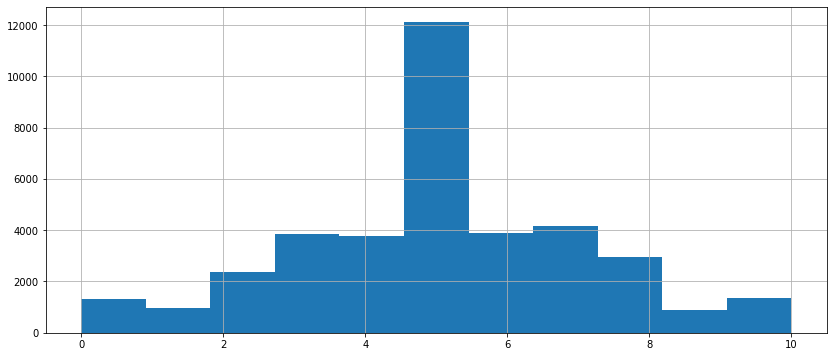

In [66]:
pvq_centred_scores.lrscale.hist(bins=11, figsize=[14,6])

## Merging datasets


In [124]:
ess9 = pd.read_csv("../datasets/ESS/ess9_REVERSED_CENTRED.csv")
ess8 = pd.read_csv("../datasets/pvq21_REVERSED_CENTRED.csv")

In [132]:
ess9.shape

(37652, 12)

In [131]:
ess8.shape

(36360, 12)

In [133]:
frames = [ess8, ess9]
merged = pd.concat(frames)

In [134]:
merged.shape

(74012, 12)

In [147]:
merged.to_csv("../datasets/ESS/ess_8-9_merged.csv", index=False)

In [146]:
merged.isnull().sum().sum()

0

In [148]:
e = pd.read_csv("../datasets/ESS/ess_8-9_merged.csv")
print(e.isnull().sum().sum())

0


In [145]:
merged.dropna(axis=0, inplace=True)